In [1]:
import pandas as pd

In [2]:
from matplotlib import pyplot as plt

In [3]:
Climate_data=pd.read_csv('climate_change_indicators.csv')

In [4]:
Climate_data

,ObjectId,Country,ISO2,ISO3,Indicator,Unit,Source,CTS_Code,CTS_Name,CTS_Full_Descriptor,...,F2013,F2014,F2015,F2016,F2017,F2018,F2019,F2020,F2021,F2022
0,1,"Afghanistan, Islamic Rep. of",AF,AFG,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.281,0.456,1.093,1.555,1.540,1.544,0.910,0.498,1.327,2.012
1,2,Albania,AL,ALB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.333,1.198,1.569,1.464,1.121,2.028,1.675,1.498,1.536,1.518
2,3,Algeria,DZ,DZA,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.192,1.690,1.121,1.757,1.512,1.210,1.115,1.926,2.330,1.688
3,4,American Samoa,AS,ASM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.257,1.170,1.009,1.539,1.435,1.189,1.539,1.430,1.268,1.256
4,5,"Andorra, Principality of",AD,AND,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,0.831,1.946,1.690,1.990,1.925,1.919,1.964,2.562,1.533,3.243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,221,Western Sahara,EH,ESH,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.423,1.401,1.510,1.732,2.204,0.942,1.477,2.069,1.593,1.970
221,222,World,NaN,WLD,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,1.016,1.053,1.412,1.660,1.429,1.290,1.444,1.711,1.447,1.394
222,223,"Yemen, Rep. of",YE,YEM,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
223,224,Zambia,ZM,ZMB,Temperature change with respect to a baseline ...,Degree Celsius,Food and Agriculture Organization of the Unite...,ECCS,Surface Temperature Change,"Environment, Climate Change, Climate Indicator...",...,0.790,0.917,1.450,1.401,0.105,0.648,0.855,0.891,0.822,0.686


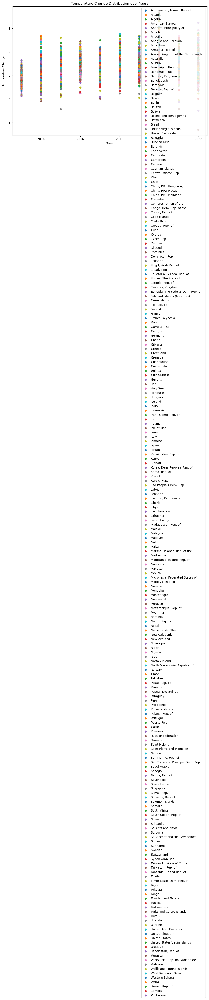

In [10]:
fig, ax = plt.subplots(figsize=(12, 8))
for index, row in Climate_data.iterrows():
    ax.scatter(range(2013, 2023), row[['F2013', 'F2014', 'F2015', 'F2016', 'F2017', 'F2018', 'F2019', 'F2020', 'F2021', 'F2022']], label=row['Country'])
    ax.set_xlabel('Years')
ax.set_ylabel('Temperature Change')
ax.set_title('Temperature Change Distribution over Years')
ax.legend()

plt.show()

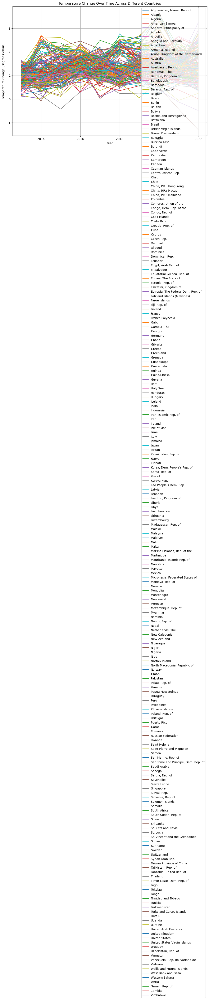

In [19]:
countries = Climate_data['Country'].unique()

plt.figure(figsize=(12, 8))
for country in countries:
    Eth_data = Climate_data[Climate_data['Country'] == country]
    years = [f'F{year}' for year in range(2013, 2023)]
    temperature_changes = Eth_data[years].values.tolist()[0]
    plt.plot(range(2013, 2023), temperature_changes, label=country)
    plt.xlabel('Year')
plt.ylabel('Temperature Change (Degree Celsius)')
plt.title('Temperature Change Over Time Across Different Countries')
plt.legend()
plt.grid(True)
plt.show()

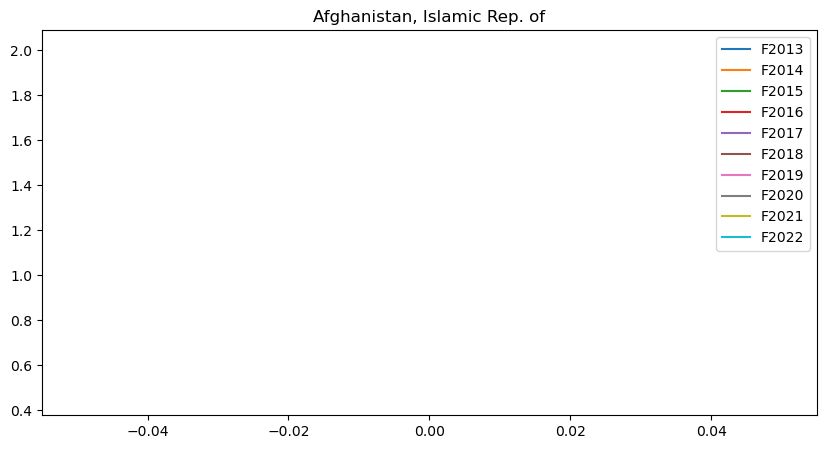

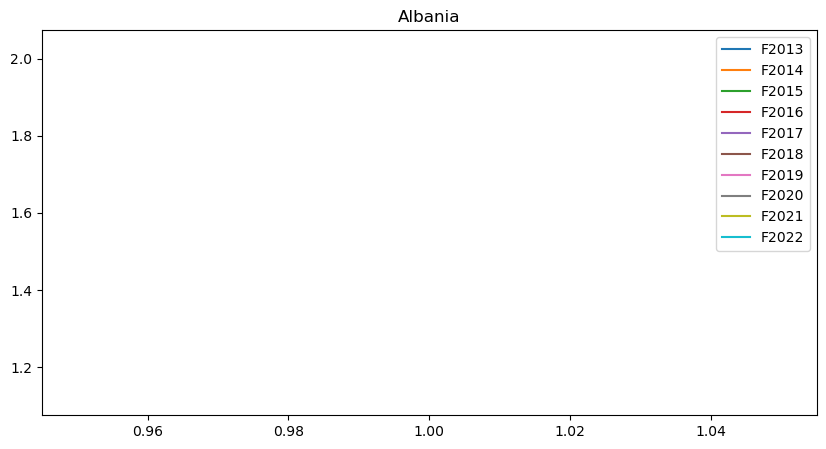

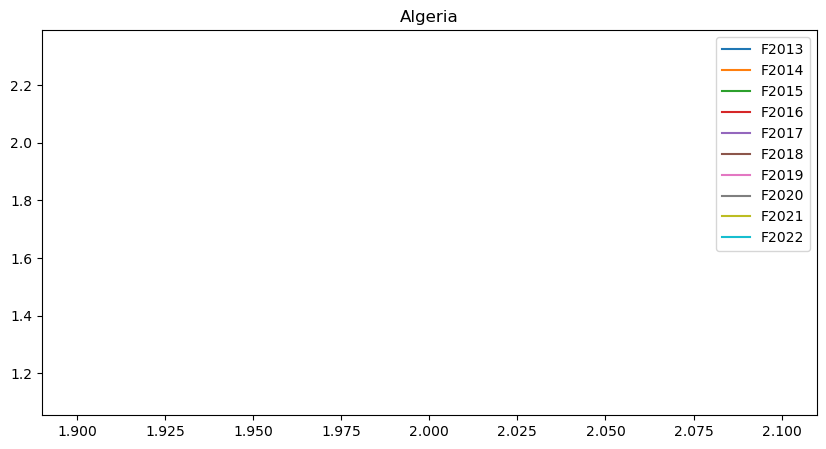

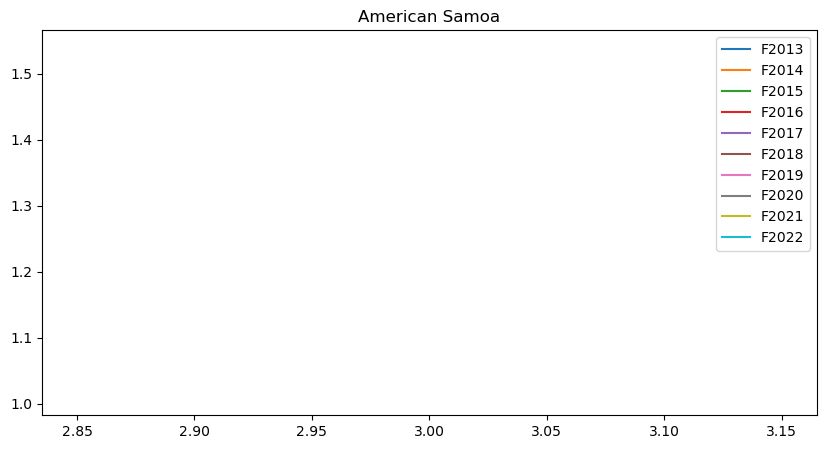

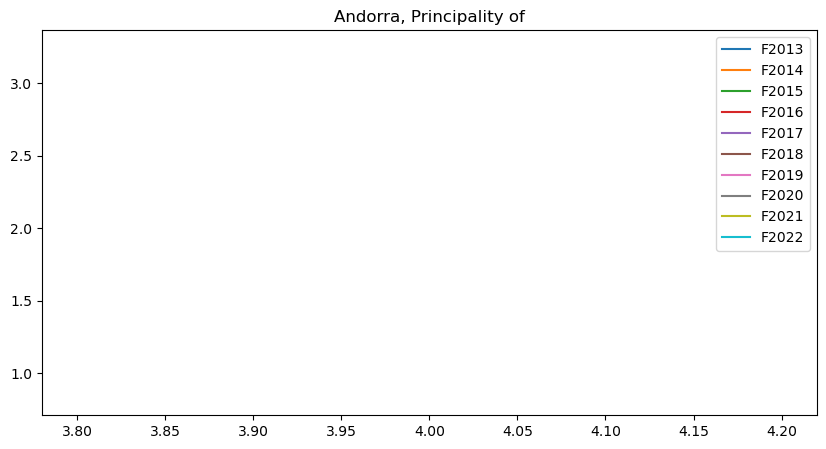

...

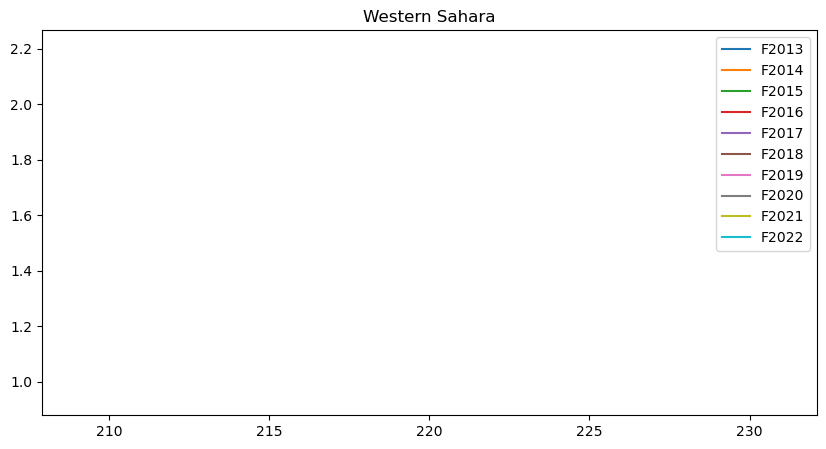

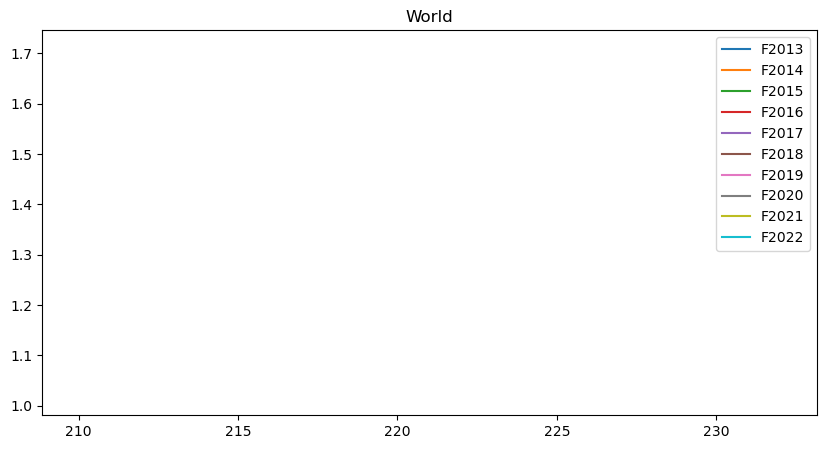

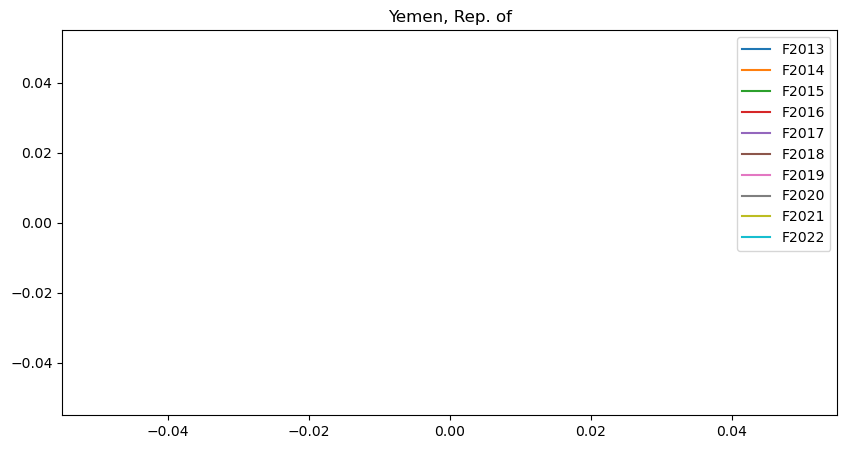

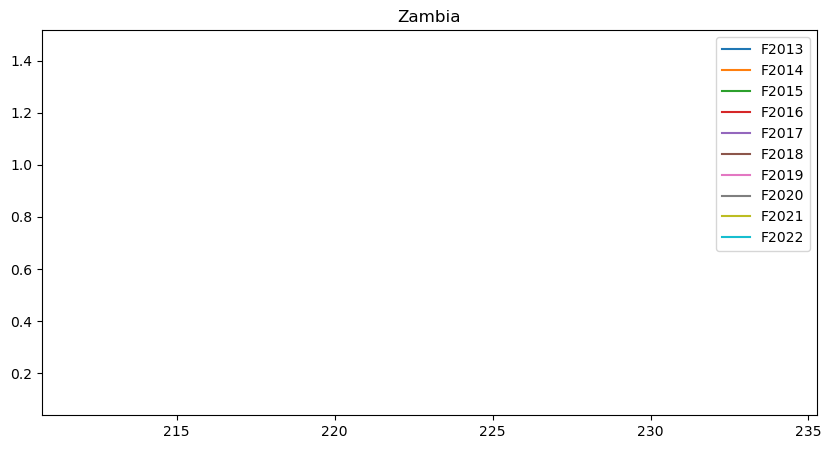

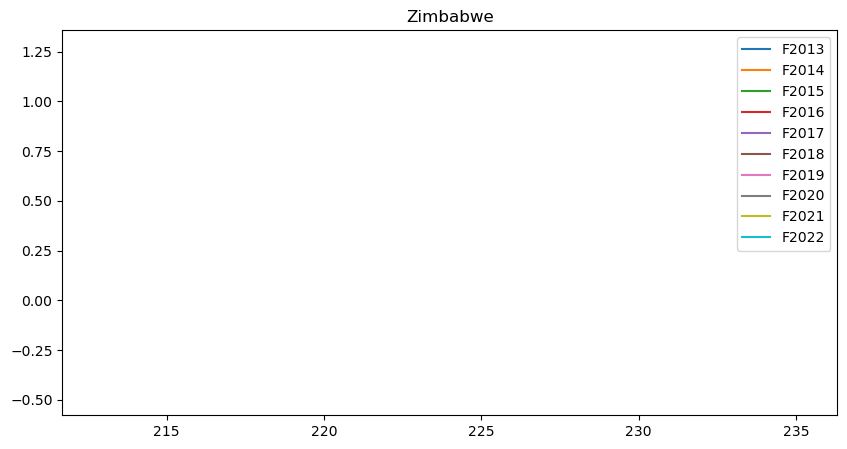

In [21]:
years = ['F2013', 'F2014', 'F2015', 'F2016', 'F2017', 'F2018', 'F2019', 'F2020', 'F2021', 'F2022']
for country in Climate_data['Country'].unique():
    df_country = Climate_data[Climate_data['Country'] == country]
    plt.figure(figsize=(10,5))
    for year in years:
        plt.plot(df_country[year], label=year)
    plt.title(country)
    plt.legend()
    plt.show()

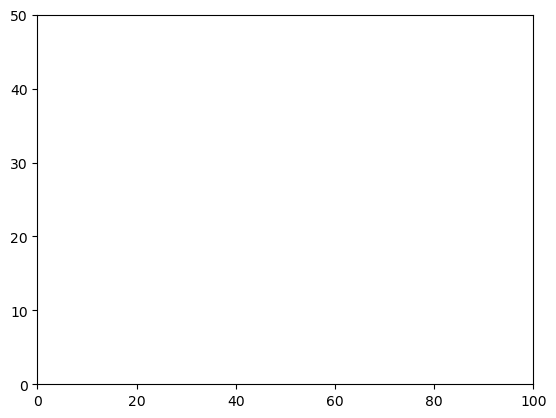

In [23]:
import matplotlib.animation as animation
import numpy as np

fig, ax = plt.subplots()
countries = ['USA', 'UK', 'Germany', 'France']
temperatures = {country: np.random.normal(25, 5, 100) for country in countries}

lines = [ax.plot([], [])[0] for _ in countries]

def init():
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 50)
    return lines

def update(frame):
    for i, country in enumerate(countries):
        lines[i].set_data(range(frame), temperatures[country][:frame])
    return lines

ani = animation.FuncAnimation(fig, update, frames=100, init_func=init, blit=True)

plt.show()


In [24]:
import plotly.graph_objects as go
import numpy as np

# Generate random data
countries = ['USA', 'UK', 'Germany', 'France']
years = np.arange(2000, 2020, 1)
temperatures = np.random.normal(20, 5, (len(years), len(countries)))

fig = go.Figure(data=[go.Surface(z=temperatures, x=years, y=countries)])

fig.update_layout(title='Temperature Change Over Time',
                  height=700,
                  scene=dict(xaxis_title='Year', yaxis_title='Country', zaxis_title='Temperature'),
                  updatemenus=[dict(type='buttons',
                                    buttons=[dict(label='Play',
                                                  method='animate',
                                                  args=[None, {'frame': {'duration': 1000}}])])])

fig.show()
